## Cleaned group notebook
#### Transit corridor group  
Our group tries to analyze the discrepancy between public transit needs and current public transit provisions in LA. This notebook contains important charts, maps and other coding material relevant for our final project.

#### Installing ans importing required libraries

In [ ]:
pip install folium

In [ ]:
pip install matplotlib

In [ ]:
pip install mapclassify

In [ ]:
import pandas as pd
import geopandas as gpd

#### Managing structural data

In [ ]:
#load a data file and changing data type of FIPS into strings for leading zeros
df = pd.read_csv(
    '/content/US_Census_LA_County.csv',
    dtype=
    {
        'FIPS':str,
    }
)

<ipython-input-73-c3ad694df3bf>:1: DtypeWarning: Columns (294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,320,321,322) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(


In [ ]:
#creating new dataframe including data to be used
columns_to_keep = ['FIPS',
                   'DP1_0024C',
                   'DP1_0024P',
                   ]
df2 = df[columns_to_keep]

In [ ]:
#change the column names to common language
df2.columns = ['FIPS',
'Population Over 65',
'Percent_of_Population_Over_65',
]
df2.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2488 entries, 0 to 2487
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   FIPS                           2488 non-null   object 
 1   Population Over 65             2488 non-null   int64  
 2   Percent_of_Population_Over_65  2488 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 58.4+ KB


In [ ]:
#load another data file and changing data type of FIPS into strings for leading zeros
df3 = pd.read_csv(
    '/content/means_of_commute.csv',
    dtype=
    {
        'FIPS':str,
    }
)

<ipython-input-76-8597440a5783>:1: DtypeWarning: Columns (5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,197,199,201,211,212,217,218,223,224,229,230,235,236,241,242,247,248,253,254,259,260,265,266,271,272,277,278,283,284,289,290,295,296,301,302,307,308,313,314,319,320,325,326,331,332,337,338,343,344,349,350,355,356,361,362,373,374,379,380,385,386,391,392,397,398,403,404,409,410,415,416,457,458,463,464,469,470,475,476,481,482,487,488,493,494,499,500,505,506,511,512,517,518,523,524,529,530,

In [ ]:
#creating new dataframe including data to be used
columns_to_keep2 = ['FIPS',
                   'S0802_C04_098E',]
df4 = df3[columns_to_keep2]

In [ ]:
#change the column names to common language
df4.columns = ['FIPS',
'Percentage_of_Public_Transportation',]
df4.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 2 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   FIPS                                 2346 non-null   object 
 1   Percentage_of_Public_Transportation  2346 non-null   float64
dtypes: float64(1), object(1)
memory usage: 36.8+ KB


In [ ]:
#importing data of percentage without vehicle
tracts2=gpd.read_file('/content/Without_Vehicle.geojson')
tracts2.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2495 entries, 0 to 2494
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   tract                2495 non-null   object  
 1   no_vehicle           2495 non-null   int64   
 2   no_vehicle_universe  2495 non-null   int64   
 3   no_vehicle_pct       2471 non-null   float64 
 4   sup_dist             2495 non-null   object  
 5   csa                  2495 non-null   object  
 6   spa                  2495 non-null   object  
 7   ESRI_OID             2495 non-null   int64   
 8   Shape__Area          2495 non-null   float64 
 9   Shape__Length        2495 non-null   float64 
 10  geometry             2495 non-null   geometry
dtypes: float64(3), geometry(1), int64(3), object(4)
memory usage: 214.5+ KB


In [ ]:
columns2 = list(tracts2)
columns2

['tract',
 'no_vehicle',
 'no_vehicle_universe',
 'no_vehicle_pct',
 'sup_dist',
 'csa',
 'spa',
 'ESRI_OID',
 'Shape__Area',
 'Shape__Length',
 'geometry']

In [ ]:
tracts2.columns = ['FIPS',
 'no_vehicle',
 'no_vehicle_universe',
 'Percentage_of_Without_Vehicle',
 'sup_dist',
 'csa',
 'spa',
 'ESRI_OID',
 'Shape__Area',
 'Shape__Length',
 'geometry']

In [ ]:
#creating new dataframe including data to be used
columns_to_keep3 = ['FIPS',
                   'Percentage_of_Without_Vehicle',
                   'geometry']
tracts3 = tracts2[columns_to_keep3]

In [ ]:
#merging dataframe and geodataframe of census tracts
tracts_combined=tracts3.merge(df2,on="FIPS")
tracts_combined.info(verbose=True, show_counts=True)
tracts_combined.sample(5)

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2488 entries, 0 to 2487
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   FIPS                           2488 non-null   object  
 1   Percentage_of_Without_Vehicle  2471 non-null   float64 
 2   geometry                       2488 non-null   geometry
 3   Population Over 65             2488 non-null   int64   
 4   Percent_of_Population_Over_65  2488 non-null   float64 
dtypes: float64(2), geometry(1), int64(1), object(1)
memory usage: 116.6+ KB


,FIPS,Percentage_of_Without_Vehicle,geometry,Population Over 65,Percent_of_Population_Over_65
2324,06037900301,3.0,"POLYGON ((-118.07716 34.71899, -118.05917 34.7...",368,9.3
1625,06037502603,1.0,"POLYGON ((-118.10080 33.96126, -118.09901 33.9...",556,16.3
1560,06037481711,15.8,"POLYGON ((-118.12293 34.06978, -118.11684 34.0...",915,19.9
1275,06037403409,5.6,"POLYGON ((-117.86193 34.05308, -117.85247 34.0...",748,17.8
1216,06037401311,3.3,"POLYGON ((-117.82403 34.11755, -117.82239 34.1...",1053,15.2


### Maps and charts !

In [119]:
#importing additional material
from shapely.geometry import Point
import folium
import matplotlib.pyplot as plt
import matplotlib

####plotting metro station and creating .5 mile buffers around each station

In [ ]:
metro = gpd.read_file('/content/All_MetroRail_Stations.zip', crs='epsg:3857')
metro.info(verbose=True, show_counts=True)

buffer_distance = 0.8/92
buffered_points = metro.geometry.buffer(buffer_distance)

buffered_points_gdf = gpd.GeoDataFrame(geometry=buffered_points)
buffered_points_gdf.crs = 'EPSG:3857'

buffered_points.sample(5)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 107 entries, 0 to 106
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   STOP_ID    107 non-null    object  
 1   STOP_NAME  107 non-null    object  
 2   STOP_LAT   107 non-null    float64 
 3   STOP_LON   107 non-null    float64 
 4   geometry   107 non-null    geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 4.3+ KB


<ipython-input-102-e507a5c05270>:5: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffered_points = metro.geometry.buffer(buffer_distance)


74    POLYGON ((-118.21095 34.04722, -118.21099 34.0...
10    POLYGON ((-118.23446 33.94222, -118.23451 33.9...
30    POLYGON ((-118.39556 34.02932, -118.39560 34.0...
67    POLYGON ((-118.13190 33.91307, -118.13195 33.9...
15    POLYGON ((-118.23439 34.01965, -118.23443 34.0...
dtype: geometry

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 551 entries, 2281 to 1204
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   FIPS                           551 non-null    object  
 1   Percentage_of_Without_Vehicle  549 non-null    float64 
 2   geometry                       551 non-null    geometry
 3   Population Over 65             551 non-null    int64   
 4   Percent_of_Population_Over_65  551 non-null    float64 
dtypes: float64(2), geometry(1), int64(1), object(1)
memory usage: 25.8+ KB


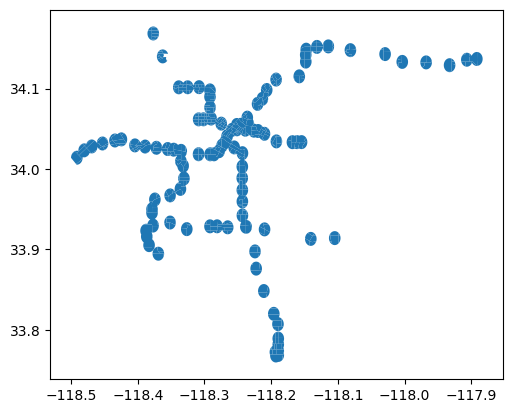

In [ ]:
tracts_combined_clip = gpd.clip(tracts_combined, buffered_points)
tracts_combined_clip.plot()
tracts_combined_clip.info(verbose=True, show_counts=True)

In [ ]:
tracts_combined_notclip = tracts_combined.difference(tracts_combined_clip)
tracts_combined_notclip.info(verbose=True, show_counts=True)

<class 'geopandas.geoseries.GeoSeries'>
Int64Index: 2488 entries, 0 to 2487
Series name: None
Non-Null Count  Dtype   
--------------  -----   
551 non-null    geometry
dtypes: geometry(1)
memory usage: 38.9 KB


/usr/local/lib/python3.10/dist-packages/geopandas/base.py:31: UserWarning: The indices of the two GeoSeries are different.
  warn("The indices of the two GeoSeries are different.")


In [ ]:
#add empty folium map
m = folium.Map(location=[34.051850, -118.243322], tiles="Cartodb Positron")

#create choropleth
folium.Choropleth(
    geo_data=tracts_combined_clip,
    name='Percentage_of_Without_Vehicle',
    data=tracts_combined_clip,
    popup=tracts_combined_clip.Percentage_of_Without_Vehicle,
    columns=['FIPS', 'Percentage_of_Without_Vehicle'],
    fill_color='PuRd',
    key_on='feature.properties.FIPS',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Percentage_of_Without_Vehicle'
).add_to(m)

# choropleth as new variable with same data
g = folium.Choropleth(
    geo_data=tracts_combined_clip,
    name='Percent_of_Population_Over_65',
    data=tracts_combined_clip,
    popup=tracts_combined_clip.Percent_of_Population_Over_65,
    columns=['FIPS', 'Percent_of_Population_Over_65'],
    fill_color='PuRd',
    key_on='feature.properties.FIPS',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Percent_of_Population_Over_65'
).add_to(m)

folium.LayerControl(position='topright', collapsed=True, autoZIndex=True).add_to(m)
m

#### mapping the percentage over 65 years old overlaying with metro stations

In [ ]:
m = tracts_combined.explore(
    column="Percent_of_Population_Over_65",  # make choropleth based on "POP2010" column
    scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
    legend=True,  # show legend
    k=10,  # use 10 bins
    tooltip=False,  # hide tooltip
    popup=["Percent_of_Population_Over_65"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="Percent of Population Over 65",  # name of the layer in the map
)

metro.explore(
    m=m,  # pass the map object
    color="red",  # use red color on all points
    marker_kwds=dict(radius=5, fill=True),  # make marker radius 10px with fill
    tooltip=False,  # hide tooltip
    tooltip_kwds=dict(labels=False),  # do not show column label in the tooltip
    name="metro stations",  # name of the layer in the map
)

folium.TileLayer("CartoDB positron", show=False).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('Percent_of_Population_Over_65.html')
m  # show map

####mapping the car ownership overlaying with metro stations

In [ ]:
m = tracts_combined.explore(
    column="Percentage_of_Without_Vehicle",  # make choropleth based on "POP2010" column
    scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
    legend=True,  # show legend
    k=10,  # use 10 bins
    tooltip=False,  # hide tooltip
    popup=["Percentage_of_Without_Vehicle"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="Percentage of Without Vehicle",  # name of the layer in the map
)

metro.explore(
    m=m,  # pass the map object
    color="red",  # use red color on all points
    marker_kwds=dict(radius=5, fill=True),  # make marker radius 10px with fill
    tooltip=False,  # hide tooltip
    tooltip_kwds=dict(labels=False),  # do not show column label in the tooltip
    name="metro stations",  # name of the layer in the map
)

folium.TileLayer("CartoDB positron", show=False).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('Percentage_of_Without_Vehicle.html')
m  # show map

In [ ]:
#merging another dataframe and geodataframe of census tracts
tracts_combined2=tracts_combined.merge(df4,on="FIPS")
tracts_combined2.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2015 entries, 0 to 2014
Data columns (total 6 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   FIPS                                 2015 non-null   object  
 1   Percentage_of_Without_Vehicle        2000 non-null   float64 
 2   geometry                             2015 non-null   geometry
 3   Population Over 65                   2015 non-null   int64   
 4   Percent_of_Population_Over_65        2015 non-null   float64 
 5   Percentage_of_Public_Transportation  2015 non-null   float64 
dtypes: float64(3), geometry(1), int64(1), object(1)
memory usage: 110.2+ KB


<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 439 entries, 1875 to 1206
Data columns (total 6 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   FIPS                                 439 non-null    object  
 1   Percentage_of_Without_Vehicle        437 non-null    float64 
 2   geometry                             439 non-null    geometry
 3   Population Over 65                   439 non-null    int64   
 4   Percent_of_Population_Over_65        439 non-null    float64 
 5   Percentage_of_Public_Transportation  439 non-null    float64 
dtypes: float64(3), geometry(1), int64(1), object(1)
memory usage: 24.0+ KB


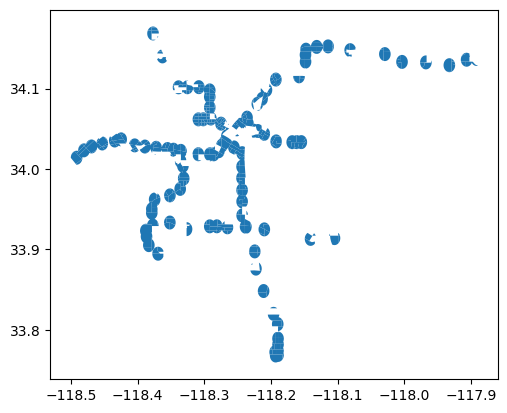

In [ ]:
tracts_combined2_clip = gpd.clip(tracts_combined2, buffered_points)
tracts_combined2_clip.plot()
tracts_combined2_clip.info(verbose=True, show_counts=True)

#### mapping the public transit commuters overlaying with metro stations

In [ ]:
m = tracts_combined2.explore(
    column="Percentage_of_Public_Transportation",  # make choropleth based on "POP2010" column
    scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
    legend=True,  # show legend
    k=10,  # use 10 bins
    tooltip=False,  # hide tooltip
    popup=["Percentage_of_Public_Transportation"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="Percentage_of_Public_Transportation",  # name of the layer in the map
)

metro.explore(
    m=m,  # pass the map object
    color="red",  # use red color on all points
    marker_kwds=dict(radius=5, fill=True),  # make marker radius 10px with fill
    tooltip=False,  # hide tooltip
    tooltip_kwds=dict(labels=False),  # do not show column label in the tooltip
    name="metro stations",  # name of the layer in the map
)

folium.TileLayer("CartoDB positron", show=False).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('Percentage_of_Public_Transportation.html')
m  # show map

#### exploring the relationship between car ownership and public trans usage by scatter plot

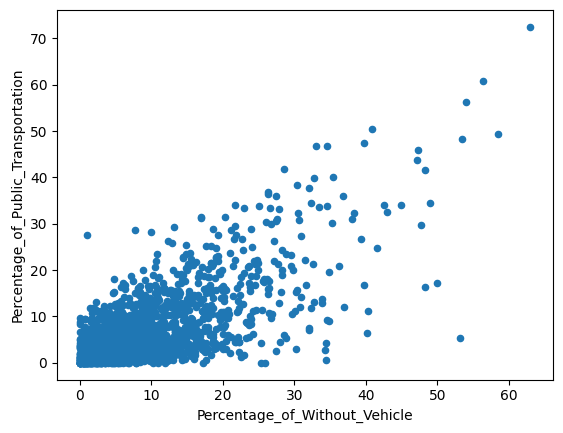

In [ ]:
tracts_combined2.plot.scatter(x='Percentage_of_Without_Vehicle',y='Percentage_of_Public_Transportation')
plt.savefig('Without_Vehicle&Public_Transportation')

#### exploring the difference of demographic characteristics (older population, transit commuter, and car ownership) between transit corridor and overall LA County

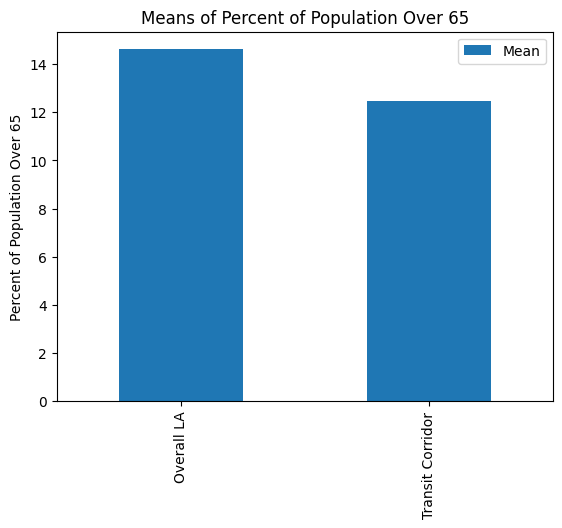

In [ ]:
# Calculate the means of the two columns
mean_col1 = tracts_combined['Percent_of_Population_Over_65'].mean()
mean_col2 = tracts_combined_clip['Percent_of_Population_Over_65'].mean()

# Create a new dataframe with the means
mean_df = pd.DataFrame({'Column': ['Overall LA', 'Transit Corridor'], 'Mean': [mean_col1, mean_col2]})

# Plot the bar chart
mean_df.plot(x='Column', y='Mean', kind='bar')

# Add labels and title
plt.xlabel('')
plt.ylabel('Percent of Population Over 65')
plt.title('Means of Percent of Population Over 65')

# Show the plot
plt.savefig('Means_of_Percent_of_Population_Over_65.png')
plt.show()

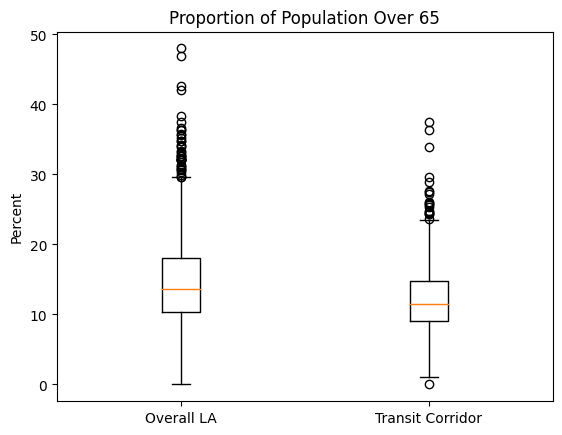

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the box plots for the two dataframes
ax.boxplot([tracts_combined['Percent_of_Population_Over_65'], tracts_combined_clip['Percent_of_Population_Over_65']])

# Set the x-axis tick labels
ax.set_xticklabels(['Overall LA', 'Transit Corridor'])

# Set the y-axis label
ax.set_ylabel('Percent')

# Set the title
ax.set_title('Proportion of Population Over 65')

# Show the plot
plt.savefig('Box_Means_of_Percent_of_Population_Over_65.png')
plt.show()

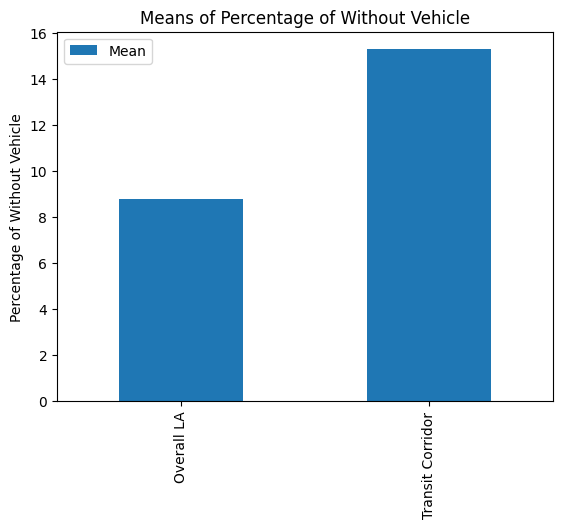

In [ ]:
# Calculate the means of the two columns
mean_col1 = tracts_combined['Percentage_of_Without_Vehicle'].mean()
mean_col2 = tracts_combined_clip['Percentage_of_Without_Vehicle'].mean()

# Create a new dataframe with the means
mean_df = pd.DataFrame({'Column': ['Overall LA', 'Transit Corridor'], 'Mean': [mean_col1, mean_col2]})

# Plot the bar chart
mean_df.plot(x='Column', y='Mean', kind='bar')

# Add labels and title
plt.xlabel('')
plt.ylabel('Percentage of Without Vehicle')
plt.title('Means of Percentage of Without Vehicle')

# Show the plot
plt.savefig('Means_of_Percentage_of_Without_Vehicle.png')
plt.show()

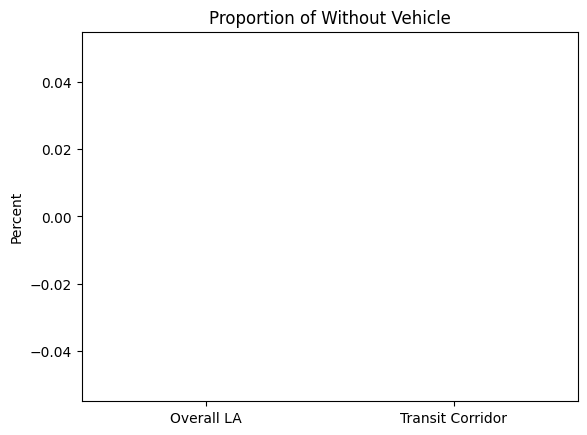

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the box plots for the two dataframes
ax.boxplot([tracts_combined['Percentage_of_Without_Vehicle'], tracts_combined_clip['Percentage_of_Without_Vehicle']])

# Set the x-axis tick labels
ax.set_xticklabels(['Overall LA', 'Transit Corridor'])

# Set the y-axis label
ax.set_ylabel('Percent')

# Set the title
ax.set_title('Proportion of Without Vehicle')

# Show the plot
plt.show()

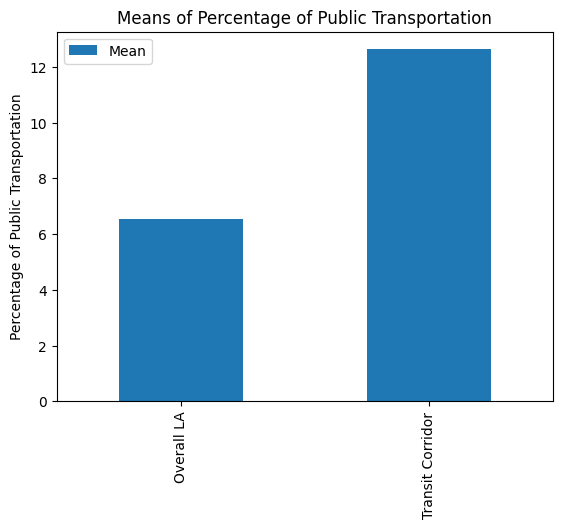

In [ ]:
# Calculate the means of the two columns
mean_col1 = tracts_combined2['Percentage_of_Public_Transportation'].mean()
mean_col2 = tracts_combined2_clip['Percentage_of_Public_Transportation'].mean()

# Create a new dataframe with the means
mean_df = pd.DataFrame({'Column': ['Overall LA', 'Transit Corridor'], 'Mean': [mean_col1, mean_col2]})

# Plot the bar chart
mean_df.plot(x='Column', y='Mean', kind='bar')

# Add labels and title
plt.xlabel('')
plt.ylabel('Percentage of Public Transportation')
plt.title('Means of Percentage of Public Transportation')

# Show the plot
plt.savefig('Means_of_Percentage_of_Public_Transportation.png')
plt.show()

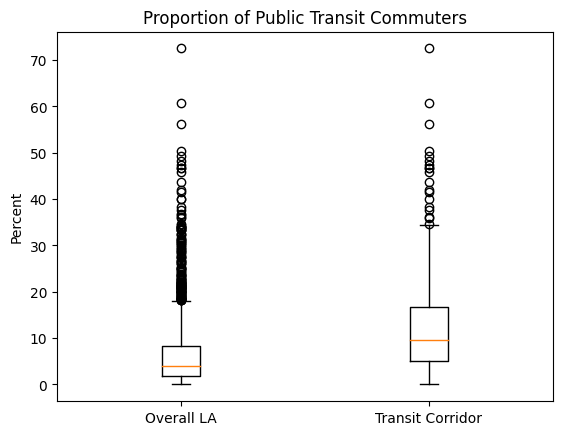

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the box plots for the two dataframes
ax.boxplot([tracts_combined2['Percentage_of_Public_Transportation'], tracts_combined2_clip['Percentage_of_Public_Transportation']])

# Set the x-axis tick labels
ax.set_xticklabels(['Overall LA', 'Transit Corridor'])

# Set the y-axis label
ax.set_ylabel('Percent')

# Set the title
ax.set_title('Proportion of Public Transit Commuters')

# Show the plot
plt.savefig('Box_Percentage_of_Public_Transportation.png')
plt.show()

#### Mapping income

In [104]:
geojson_path = 'Median_Income_and_AMI_(census_tract).geojson'
incomedf = gpd.read_file(geojson_path)

<Axes: ylabel='Frequency'>

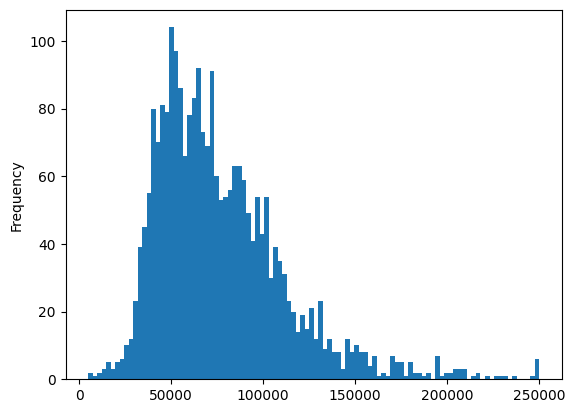

In [107]:
#relevant chart
incomedf['med_hh_income'].plot.hist(bins=100)

In [108]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

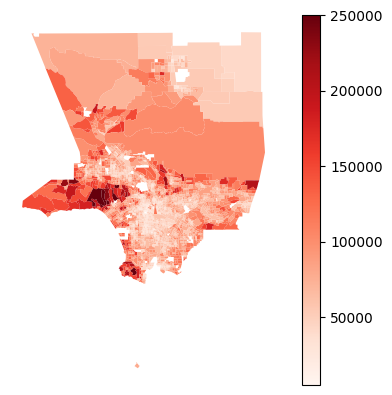

In [120]:
#first income map
norm = Normalize(vmin=incomedf['med_hh_income'].min(), vmax=incomedf['med_hh_income'].max())
fig, ax = plt.subplots()
incomedf.plot(ax=ax, column='med_hh_income', cmap='Reds', norm=norm, legend=True)
ax.set_axis_off()

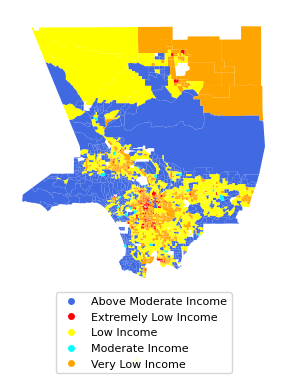

In [133]:
# Map of the ami income categories
colors = ["royalblue", "red", "yellow", "cyan","orange"]
fig, ax = plt.subplots()
cmap = matplotlib.colors.ListedColormap(colors)
incomedf.plot(ax=ax,
    figsize=(12,10),
                 column='ami_category',
        cmap=cmap,
                 legend=True,
              legend_kwds={'loc': 'lower center','fontsize': 8, 'markerscale': 0.5})
ax.set_axis_off()

In [159]:
#creating a function to create different binary maps accordung to different cut offs
income_category = {'below_med_income', 'below_60pct_med_income', 'below_moderate_income'}

def income_map_category(income_category):
    fig, ax = plt.subplots()
    incomedf.plot(ax=ax,
        figsize=(12, 10),
                 column='below_med_income',
                 legend=True,
                  legend_kwds={'loc': 'lower right'})
    if income_category=='below_med_income':
        a='below median income'
    if income_category=='below_60pct_med_income':
      a='below 60% median income'
    if income_category=='below_moderate_income':
      a='below_moderate_income'
    ax.set_title('Is the income '+str(a)+'?')
    ax.set_axis_off()

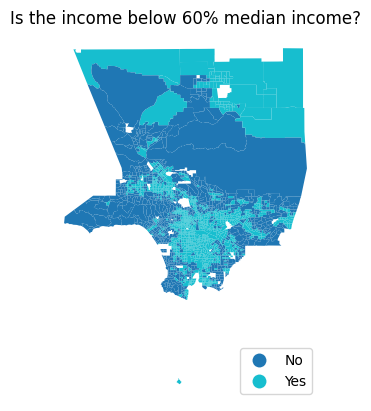

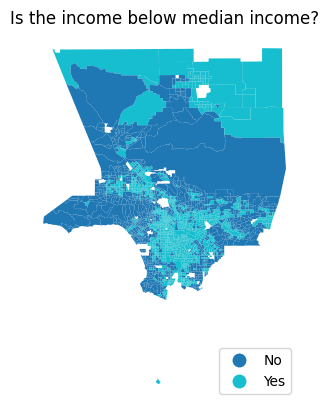

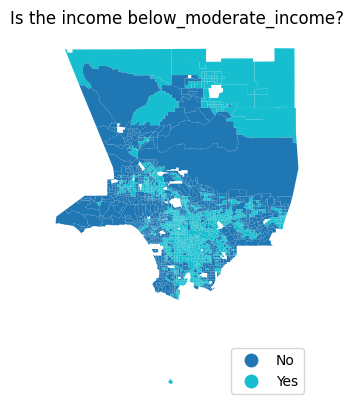

In [160]:
#call the funtion in a loop
for x in income_category:
    income_map_category(x)

In [164]:
#folium map of the stations and the income
colors = ["royalblue", "red", "yellow", "cyan","orange"]
m = incomedf.explore(
    column="ami_category",  # make choropleth based on "Percent_of_Population_Over_65" column
    legend=True, # show legend
    k=10,  # use 10 bins
    tooltip=False,  # hide tooltip
    popup=["ami_category"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="Household income categories",  # name of the layer in the map
    cmap = matplotlib.colors.ListedColormap(colors)
)

metro.explore( #”metro” is the dataframe of metro stations’ points
    m=m,  # pass the map object
    color="brown",  # use red color on all points
    marker_kwds=dict(radius=5, fill=True),  # make marker radius 10px with fill
    tooltip=False,  # hide tooltip
    tooltip_kwds=dict(labels=False),  # do not show column label in the tooltip
    name="metro stations",  # name of the layer in the map
)

folium.TileLayer("CartoDB positron", show=False).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('Percent_of_Population_Over_65.html')
m  # show map


### Analysis
Based on our different maps and charts, we observe that there is a correlation between income and the stations' locations. These areas also tend to show a lower percentage of car ownership.
Given the litteratue on the topic, this makes sense because the people who tend to use transit the most are the carless and the less afluent.
Basing ourselves on one of our project assumption which states that the rail transportation is considered by riders as more comfortable than the bus and an indicator of public authorities effort and interst to provide people with quality means of transportation, we identify the area along the Harbour Freeway between the Exposition Park and Athens as a critical area in need of more transit investments as it shows a high proportion of Extremely and Very low income housholds as well as a low car ownership rate.
We acknowledge that the area is already served by BRT but suggest that having a rail line over the corridor can enhance the comfort of the transit dependent people that live in the area.

Finally, our goal for the next days is to try to conduct statistical analysis of the areas that lie in the corridors and to compare it with the areas outside in order to compare the social characteristics and be able to identify any existing or non existing discrepancy.

#### Group Members
- Alain Jabbour: analyzing househould incomes  
- Simon Han: analyzing car ownership  
- Tomohiro Ujikawa: managing assignments submission and analyzing older population, transit commuter and car ownership  
- Xinyi Cao: analyzing gross rent changes and using regression analysis